In [1]:
import torch
from torch import nn, optim
from torch.nn.utils.rnn import pad_sequence
from torch.utils.data import DataLoader, Dataset, TensorDataset
import torchmetrics

import pandas as pd
from tqdm.notebook import trange, tqdm
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import ParameterGrid
from sklearn.model_selection import train_test_split
import gensim.downloader
from sklearn.linear_model import LinearRegression
import swifter

device = 'cpu'

In [24]:
#df = pd.read_json('gutenberg-dataset-v2.json')
df = pd.read_json('dataset.json')
#embedding_vectors = gensim.downloader.load('glove-twitter-25')

#embedding_dim = len(embedding_vectors['test'])
chunk_size = 2000


1820 1923
1820 8
1821 2
1822 4
1823 6
1824 7
1825 7
1826 2
1827 9
1828 12
1829 14
1830 13
1831 14
1832 27
1833 5
1834 5
1835 6
1836 6
1837 15
1838 5
1839 10
1840 5
1841 22
1842 17
1843 13
1844 16
1888 75
1845 86
1846 8
1847 7
1848 11
1849 21
1850 49
1851 34
1852 34
1853 71
1854 37
1855 9
1856 16
1857 20
1858 13
1859 11
1860 24
1861 33
1889 95
1862 36
1863 37
1864 46
1865 44
1866 24
1867 24
1868 16
1869 16
1870 27
1871 31
1872 19
1873 32
1874 30
1875 28
1876 31
1877 38
1878 30
1879 34
1880 130
1881 94
1882 105
1883 82
1884 94
1885 70
1886 82
1914 362
1887 98
1890 126
1891 139
1901 223
1892 125
1893 185
1894 162
1895 203
1911 321
1896 187
1897 195
1898 219
1908 253
1899 266
1902 254
1900 259
1903 259
1904 273
1905 269
1906 253
1922 371
1907 254
1909 276
1910 293
1912 331
1913 352
1915 340
1916 291
1917 284
1918 294
1919 313
1921 274
1920 329
1923 132


In [25]:
total_vocabulary = set()
for row in tqdm(df.iterrows(), total=len(df)):
    text = row[1]['text']
    words = text.split()
    for word in words:
        total_vocabulary.add(word)

len(total_vocabulary)

  0%|          | 0/13128 [00:00<?, ?it/s]

3112272

In [26]:
total_frequencies = {word: 0 for word in total_vocabulary}
for row in tqdm(df.iterrows(), total=len(df)):
    text = row[1]['text']
    words = text.split()
    for word in words:
        total_frequencies[word] = total_frequencies[word] + 1


  0%|          | 0/13128 [00:00<?, ?it/s]

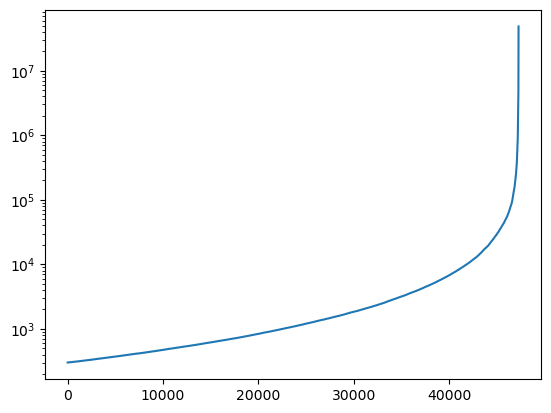

47261


In [27]:
frequency_cutoff = 300 # 500 #10000

f = [total_frequencies[x] for x in total_frequencies if total_frequencies[x] > frequency_cutoff]
f.sort()

plt.plot(f)
plt.yscale('log')
plt.show()

print(len(f))


In [28]:
select_frequencies = {}
select_vocabulary = []

select_vocabulary_set = set()

for word in tqdm(total_vocabulary):
    f = total_frequencies[word]
    if f > frequency_cutoff: #old: 500
        select_frequencies[word] = f
        select_vocabulary.append(word)
        select_vocabulary_set.add(word)


  0%|          | 0/3112272 [00:00<?, ?it/s]

In [29]:
tqdm.pandas()

def count_word_frequencies(text):
    frequencies = {word: 0 for word in select_vocabulary}
    words = text.split()
    word_count = len(words)
    for word in words:
        if word in select_vocabulary_set:
            frequencies[word] = frequencies[word] + 1

    list = np.zeros(len(select_vocabulary))
    for index, word in enumerate(select_vocabulary):
        freq = frequencies[word] / word_count
        if freq != 0:
            list[index] = -np.log(freq)
        else:
            list[index] = 0

    return list


df['word_frequencies'] = df['text'].progress_apply(count_word_frequencies)

  0%|          | 0/13128 [00:00<?, ?it/s]

In [30]:
for index, word in tqdm(enumerate(select_vocabulary), total=len(select_vocabulary)):
    df['W: ' + word] = df['word_frequencies'].apply(lambda l: l[index])


  0%|          | 0/47261 [00:00<?, ?it/s]

/tmp/ipykernel_13643/27503632.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['W: ' + word] = df['word_frequencies'].apply(lambda l: l[index])
/tmp/ipykernel_13643/27503632.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['W: ' + word] = df['word_frequencies'].apply(lambda l: l[index])
/tmp/ipykernel_13643/27503632.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.conca

In [ ]:
#df = (df.drop('title', axis=1).drop('author', axis=1).drop('text_ratio', axis=1).drop('text', axis=1).drop('weights', axis=1).drop('word_frequencies', axis=1).drop('text_len_characters', axis=1))
#df = (df.drop('title', axis=1).drop('author', axis=1).drop('text_ratio', axis=1).drop('text', axis=1).drop('word_frequencies', axis=1))

df = df.copy()

In [ ]:
df = (df.drop('title', axis=1).drop('author', axis=1).drop('text_ratio', axis=1).drop('text', axis=1).drop('word_frequencies', axis=1))

In [ ]:
df

,date,text_len_characters,weights,W: perfect,W: learn,W: little,W: reality,W: flung,W: quiet,W: studied,...,W: lightning,W: terrible,W: population,W: too,W: notice,W: application,W: assume,W: bought,W: suffered,W: sitting
252778,1820,10293,1.000000,0.000000,0.000000,7.600902,6.907755,0.0,0.000000,0.0,...,0.0,0.000000,0.000000,7.600902,0.0,0.0,0.0,0.0,0.000000,0.0
256507,1820,11490,0.076923,0.000000,0.000000,7.600902,0.000000,0.0,0.000000,0.0,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0
212056,1820,11446,0.040000,7.600902,0.000000,6.214608,0.000000,0.0,0.000000,0.0,...,0.0,0.000000,6.907755,7.600902,0.0,0.0,0.0,0.0,0.000000,0.0
251132,1820,10221,0.050000,0.000000,0.000000,0.000000,6.214608,0.0,0.000000,0.0,...,0.0,0.000000,0.000000,7.600902,0.0,0.0,0.0,0.0,0.000000,0.0
225793,1820,11109,0.014493,7.600902,0.000000,6.502290,0.000000,0.0,0.000000,0.0,...,0.0,0.000000,7.600902,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
291658,1923,10500,0.027778,0.000000,6.907755,6.907755,0.000000,0.0,7.600902,0.0,...,0.0,0.000000,0.000000,6.214608,0.0,0.0,0.0,0.0,6.907755,0.0
263561,1923,10000,0.111111,0.000000,0.000000,5.521461,0.000000,0.0,0.000000,0.0,...,0.0,0.000000,0.000000,6.502290,0.0,0.0,0.0,0.0,0.000000,0.0
244584,1923,11280,0.045455,0.000000,0.000000,5.809143,0.000000,0.0,6.502290,0.0,...,0.0,0.000000,0.000000,7.600902,0.0,0.0,0.0,0.0,0.000000,0.0
290725,1923,11009,0.022727,0.000000,0.000000,5.991465,0.000000,0.0,0.000000,0.0,...,0.0,7.600902,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0


In [ ]:
# df['date'] = (df['date']-df['date'].min())/(df['date'].max()-df['date'].min())

df = (df-df.min())/(df.max()-df.min())

df

,date,text_len_characters,weights,W: perfect,W: learn,W: little,W: reality,W: flung,W: quiet,W: studied,...,W: lightning,W: terrible,W: population,W: too,W: notice,W: application,W: assume,W: bought,W: suffered,W: sitting
252778,0.0,0.290384,1.000000,0.0,0.000000,1.000000,0.908807,0.0,0.000000,0.0,...,0.0,0.0,0.000000,1.000000,0.0,0.0,0.0,0.0,0.000000,0.0
256507,0.0,0.465846,0.067504,0.0,0.000000,1.000000,0.000000,0.0,0.000000,0.0,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0
212056,0.0,0.459396,0.030204,1.0,0.000000,0.817615,0.000000,0.0,0.000000,0.0,...,0.0,0.0,0.908807,1.000000,0.0,0.0,0.0,0.0,0.000000,0.0
251132,0.0,0.279830,0.040306,0.0,0.000000,0.000000,0.817615,0.0,0.000000,0.0,...,0.0,0.0,0.000000,1.000000,0.0,0.0,0.0,0.0,0.000000,0.0
225793,0.0,0.409997,0.004437,1.0,0.000000,0.855463,0.000000,0.0,0.000000,0.0,...,0.0,0.0,1.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
291658,1.0,0.320727,0.017857,0.0,0.908807,0.908807,0.000000,0.0,1.000000,0.0,...,0.0,0.0,0.000000,0.817615,0.0,0.0,0.0,0.0,0.908807,0.0
263561,1.0,0.247435,0.102041,0.0,0.000000,0.726422,0.000000,0.0,0.000000,0.0,...,0.0,0.0,0.000000,0.855463,0.0,0.0,0.0,0.0,0.000000,0.0
244584,1.0,0.435063,0.035714,0.0,0.000000,0.764270,0.000000,0.0,0.855463,0.0,...,0.0,0.0,0.000000,1.000000,0.0,0.0,0.0,0.0,0.000000,0.0
290725,1.0,0.395339,0.012755,0.0,0.000000,0.788257,0.000000,0.0,0.000000,0.0,...,0.0,1.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0


In [ ]:
X = df.iloc[:, 1:]
y = df['date']

X_train, X_test, y_train, y_test = train_test_split(X.values, y.values, test_size=0.2, random_state=42, shuffle=True)

In [ ]:
#train_dataloader = DataLoader((torch.from_numpy(X_train), torch.from_numpy(y_train)), batch_size=16)
#test_dataloader = DataLoader((torch.from_numpy(X_test), torch.from_numpy(y_test)), batch_size=16)

In [ ]:
# Define the linear regression model



class LinearRegressionModel(nn.Module):
    def __init__(self, input_size):
        super(LinearRegressionModel, self).__init__()
        self.linear = nn.Linear(input_size, 1)
        # self.activation = nn.Sigmoid()
        # self.linear2 = nn.Linear(1000, 1000)
        # self.activation2 = nn.ReLU()
        # self.linear3 = nn.Linear(1000, 100)
        # self.activation3 = nn.ReLU()
        # self.linear4 = nn.Linear(1000, 1)
        #self.activation4 = nn.Sigmoid()

    def forward(self, x):
        x = self.linear(x)
        # x = self.activation(x)
        # x = self.linear2(x)
        # x = self.activation2(x)
        # x = self.linear3(x)
        # x = self.activation3(x)
        # x = self.linear4(x)
        x = self.activation4(x)

        return x

In [ ]:
df.isnull().values.any()


False

In [ ]:
# Initialize the model, loss function, and optimizer

num_epochs = 200
loading_steps = 10
loading_count = 0

learning_rate = 0.0025

input_size = X_train.shape[1]
model = LinearRegressionModel(input_size)
model.to(device)

criterion = nn.L1Loss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

X_train_tensor = torch.FloatTensor(X_train).to(device)
y_train_tensor = torch.FloatTensor(y_train).to(device).view(-1, 1)

train_dataset = TensorDataset(X_train_tensor, y_train_tensor)

train_loader = DataLoader(train_dataset, batch_size=len(X_train_tensor) // 1, shuffle=True)

losses = []


model.train()

for epoch in tqdm(range(num_epochs)):

    for inputs, labels in (train_loader):
        optimizer.zero_grad()

        outputs = model(inputs)
        loss = criterion(outputs, labels)
        losses.append(loss.item())

        loss.backward()

        # https://stackoverflow.com/questions/66648432/pytorch-test-loss-becoming-nan-after-some-iteration
        #torch.nn.utils.clip_grad_norm_(model.parameters(), 5)

        optimizer.step()

    if epoch % (num_epochs / loading_steps) == 0:
        print(f'{loading_count}0% done')
        print(f'Loss: {loss}')
        loading_count = loading_count + 1

print('finished')


  0%|          | 0/200 [00:00<?, ?it/s]

00% done
Loss: 0.7309936881065369
10% done
Loss: 0.5867710709571838
20% done
Loss: 0.5585158467292786
30% done
Loss: 0.547447919845581
40% done
Loss: 0.5404391884803772
50% done
Loss: 0.5354734659194946
60% done
Loss: 0.5317398905754089
70% done
Loss: 0.5288208723068237
80% done
Loss: 0.526472270488739
90% done
Loss: 0.5245396494865417
finished


In [ ]:
model.train()
loading_count = 0

for epoch in tqdm(range(2000)):

    for inputs, labels in (train_loader):
        optimizer.zero_grad()

        outputs = model(inputs)
        loss = criterion(outputs, labels)
        losses.append(loss.item())

        loss.backward()

        # https://stackoverflow.com/questions/66648432/pytorch-test-loss-becoming-nan-after-some-iteration
        #torch.nn.utils.clip_grad_norm_(model.parameters(), 5)

        optimizer.step()

    if epoch % (num_epochs / loading_steps) == 0:
        print(f'{loading_count}0% done')
        print(f'Loss: {loss}')
        loading_count = loading_count + 1


  0%|          | 0/2000 [00:00<?, ?it/s]

00% done
Loss: 0.5229208469390869
10% done
Loss: 0.521544873714447
20% done
Loss: 0.5203613638877869
30% done
Loss: 0.519332766532898
40% done
Loss: 0.5184310078620911
50% done
Loss: 0.5176345705986023
60% done
Loss: 0.5169262290000916
70% done
Loss: 0.5162928104400635
80% done
Loss: 0.5157231688499451
90% done
Loss: 0.5152087211608887
100% done
Loss: 0.5147419571876526
110% done
Loss: 0.514316976070404
120% done
Loss: 0.5139285326004028
130% done
Loss: 0.5135723948478699
140% done
Loss: 0.5132448077201843
150% done
Loss: 0.5129426121711731
160% done
Loss: 0.5126632452011108
170% done
Loss: 0.512404203414917
180% done
Loss: 0.512163519859314
190% done
Loss: 0.5119393467903137
200% done
Loss: 0.5117302536964417
210% done
Loss: 0.5115347504615784
220% done
Loss: 0.5113517642021179
230% done
Loss: 0.5111799836158752
240% done
Loss: 0.511018693447113
250% done
Loss: 0.5108668208122253
260% done
Loss: 0.5107238292694092
270% done
Loss: 0.5105888843536377
280% done
Loss: 0.5104614496231079
2

Mean Squared Error: 0.12638881509744268


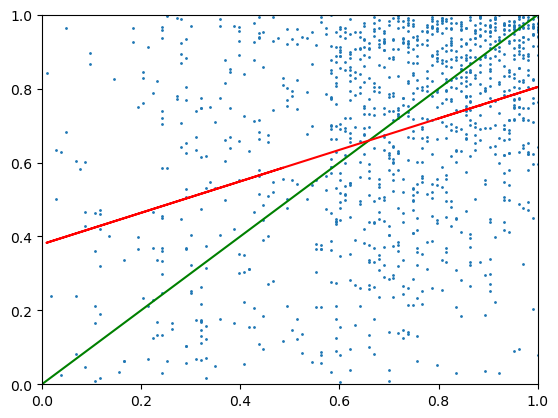

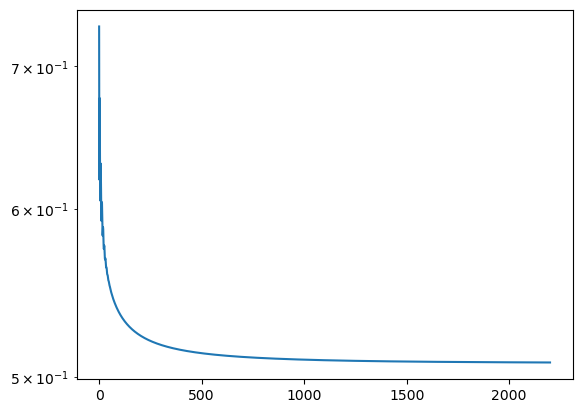

In [ ]:
model.eval()


with torch.no_grad():
    X_test_tensor = torch.FloatTensor(X_test).to(device)
    y_pred = model(X_test_tensor).detach().numpy()

    # Calculate the mean squared error to evaluate the model
    mse = ((y_test - y_pred) ** 2).mean()
    print(f"Mean Squared Error: {mse}")

    # plt.hist(y_pred, bins=100)
    # plt.show()

    # plt.hist(y_test, bins=100)
    # plt.show()


    plt.scatter(y_test, y_pred, s=1)

    plt.axline([0, 0], [1, 1], color='green')

    m, b = np.polyfit(y_test, y_pred, 1)
    plt.plot(y_test, m * y_test + b, color='red')
    plt.xlim(0, 1)
    plt.ylim(0, 1)
    plt.show()

    plt.plot(losses)
    plt.yscale('log')
    #plt.ylim(0, 0.01)
    plt.show()





# coeff_list = []
# name_list = []
# # View the coefficients
# with torch.no_grad():
#     coefficients = model.linear.weight.view(-1).numpy()

#     for i, coef in enumerate(coefficients):
#         coeff_list.append(coef)
#         name_list.append(X.columns[i])

# coef_df = pd.DataFrame(data={'names': name_list, 'coefficients': coeff_list}).sort_values('coefficients', ascending=False)

# coef_df